## Fetching Data

We are using the Reddit API to fetch data from a bunch of programming, computer science and data science related subreddits.

In [29]:
# Import Libraries
import requests
import pandas as pd
import sqlite3
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import string
import nltk
import ssl

try:
    _create_unverified_https_context = ssl._create_unverified_context
except AttributeError:
    pass
else:
    ssl._create_default_https_context = _create_unverified_https_context
nltk.download('all', quiet = True)
import html
import re
import contractions
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
warnings.filterwarnings('ignore')


In [8]:
# Define Subreddit List
subreddits = ['python', 'datascience', 'javascript', 'linux', 'opensource', 'node', 'programming', 'computerscience', 'webdev', 'statistics', 'MachineLearning', 'compsci', 'java', 'rust', 'typescript']

In [9]:
# Progress Bar Display Function
def progress (iteration, total, fill = '█'):
    printEnd = "\r"
    prefix = 'Downloading Data'
    suffix = 'Complete'
    decimals = 2
    length = 50
    downloaded = 100 * (iteration / float(total))
    percent = ("{0:." + str(decimals) + "f}").format(downloaded) if downloaded <= 100 else 100
    filledLength = int(length * iteration // total)
    bar = fill * filledLength + '-' * (length - filledLength)
    if downloaded <= 100:
        print(f'\r{prefix} |{bar}| {percent}% {suffix}', end = printEnd)

# Data Fetcher Class
class DataFetcher:
    posts = []
    after = None
    posts_per_subreddit = 1000
    downloaded = 0

    def __init__(self):
        client_id = 'dog1LGxsD9M3bXtglOzKsQ'
        client_secret = 'nc-HHPBGtz51-_r4vNLGcuCHmT39Lw'
        username = 'NoSeason1949'
        password = 'Password@1234'
        auth = requests.auth.HTTPBasicAuth(client_id, client_secret)
        data = {
            'grant_type': 'password',
            'username': username,
            'password': password,
        }
        headers = {'User-Agent': 'RedditTest/0.1 by {}'.format(username)}
        res = requests.post('https://www.reddit.com/api/v1/access_token',
                            auth=auth, data=data, headers=headers)
        self.token = res.json()['access_token']
        self.headers = {**headers, **{'Authorization': f"bearer {self.token}"}}
        self.subreddits = subreddits

    def fetch(self):
        for subreddit in self.subreddits:
            subreddit_download = 0
            while subreddit_download < self.posts_per_subreddit:
                url = f"https://oauth.reddit.com/r/{subreddit}/hot?limit=100"
                if self.after:
                     url += f"&after={self.after}"
                res = requests.get(url, headers=self.headers)
                if res.status_code == 200:
                    data = res.json()
                    for post in data['data']['children']:
                        self.posts.append(post['data'])
                        subreddit_download += 1
                        self.downloaded += 1
                        progress(self.downloaded, len(subreddits) * self.posts_per_subreddit)
                    self.after = data['data']['after']
                else:
                    print('Failed on subreddit: {}, with status code: {}'.format(subreddit, res.status_code))
                    break

    def get_data(self):
        return self.posts

# Fetch Data
data_fetcher = DataFetcher()
data_fetcher.fetch()


In [10]:
# Dataframe
df = pd.DataFrame(data_fetcher.get_data())
df.head()

,approved_at_utc,subreddit,selftext,author_fullname,saved,mod_reason_title,gilded,clicked,title,link_flair_richtext,...,post_hint,preview,url_overridden_by_dest,call_to_action,author_cakeday,crosspost_parent_list,crosspost_parent,poll_data,is_gallery,gallery_data
0,None,Python,Tell /r/python what you're working on this wee...,t2_145f96,False,None,0,False,Sunday Daily Thread: What's everyone working o...,"[{'e': 'text', 't': 'Daily Thread'}]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,None,Python,Found a neat resource related to Python over t...,t2_145f96,False,None,0,False,Saturday Daily Thread: Resource Request and Sh...,"[{'e': 'text', 't': 'Daily Thread'}]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,None,Python,&amp;#x200B;\n\nHi all!\n\nThis is a library I...,t2_srr2s,False,None,0,False,"I've built a PathDict, a library that makes it...","[{'e': 'text', 't': 'Intermediate Showcase'}]",...,self,{'images': [{'source': {'url': 'https://extern...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,None,Python,polars 0.14.19 is released. This is the first ...,t2_zvbil,False,None,0,False,polars 0.14.19 first release with larger than ...,"[{'e': 'text', 't': 'Resource'}]",...,self,{'images': [{'source': {'url': 'https://extern...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,None,Python,I was looking for a solid framework to build a...,t2_dy4f9m,False,None,0,False,"FastAPI - stable enough for production grade, ...","[{'e': 'text', 't': 'Discussion'}]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
# Check Shape
df.shape

(15702, 118)

In [12]:
# Datatypes
df.dtypes

approved_at_utc          object
subreddit                object
selftext                 object
author_fullname          object
saved                      bool
                          ...  
crosspost_parent_list    object
crosspost_parent         object
poll_data                object
is_gallery               object
gallery_data             object
Length: 118, dtype: object

## Data Cleaning & Preprocessing

We are going to preprocess the data by removing the stop words, punctuations and lemmatizing the words.

In [13]:
# Print Column Values
print(list(df.columns.values))

['approved_at_utc', 'subreddit', 'selftext', 'author_fullname', 'saved', 'mod_reason_title', 'gilded', 'clicked', 'title', 'link_flair_richtext', 'subreddit_name_prefixed', 'hidden', 'pwls', 'link_flair_css_class', 'downs', 'thumbnail_height', 'top_awarded_type', 'hide_score', 'name', 'quarantine', 'link_flair_text_color', 'upvote_ratio', 'author_flair_background_color', 'subreddit_type', 'ups', 'total_awards_received', 'media_embed', 'thumbnail_width', 'author_flair_template_id', 'is_original_content', 'user_reports', 'secure_media', 'is_reddit_media_domain', 'is_meta', 'category', 'secure_media_embed', 'link_flair_text', 'can_mod_post', 'score', 'approved_by', 'is_created_from_ads_ui', 'author_premium', 'thumbnail', 'edited', 'author_flair_css_class', 'author_flair_richtext', 'gildings', 'content_categories', 'is_self', 'mod_note', 'created', 'link_flair_type', 'wls', 'removed_by_category', 'banned_by', 'author_flair_type', 'domain', 'allow_live_comments', 'selftext_html', 'likes', '

In [14]:
# Finding Saturated Columns – Columns with same values in all rows
saturated_cols = []
for col in df.columns:
    first_value = df[col].iloc[0]
    if df[col].equals(pd.Series([first_value] * len(df[col]))):
        saturated_cols.append(col)

print(saturated_cols)

# At this point, we can drop the saturated columns as they don't provide any useful information
df.drop(saturated_cols, axis=1, inplace=True)

['approved_at_utc', 'saved', 'mod_reason_title', 'clicked', 'hidden', 'pwls', 'downs', 'top_awarded_type', 'quarantine', 'subreddit_type', 'user_reports', 'is_meta', 'can_mod_post', 'approved_by', 'is_created_from_ads_ui', 'content_categories', 'mod_note', 'removed_by_category', 'banned_by', 'likes', 'banned_at_utc', 'view_count', 'is_crosspostable', 'pinned', 'awarders', 'media_only', 'treatment_tags', 'visited', 'removed_by', 'num_reports', 'author_is_blocked', 'mod_reason_by', 'removal_reason', 'is_robot_indexable', 'report_reasons', 'discussion_type', 'mod_reports', 'parent_whitelist_status']


In [15]:
# Replace all NaN values with 0 if the column is numeric or empty string if the column is string
for col in df.columns:
    if df[col].dtype == 'float64' or df[col].dtype == 'int64':
        df[col].fillna(0, inplace=True)
    if df[col].dtype == 'object':
        df[col].fillna('', inplace=True)

In [16]:
# Convert column to string if column is not numeric or boolean
for col in df.columns:
    if df[col].dtype != 'float64' and df[col].dtype != 'int64' and df[col].dtype != 'bool':
        df[col] = df[col].astype(str)

In [17]:
# Check for title duplicates
print('Duplicate titles: {}'.format(df['title'].duplicated().sum()))

# Same post data can be repeated from the API -Delete titles that appear more than once
df.drop_duplicates(subset=['title'], keep='first', inplace=True)

Duplicate titles: 7006


In [18]:
# Print columns with missing values and their count - Should be empty list, ie. no missing values
print(list(df.isnull().sum()[df.isnull().sum() > 0]))

[]


In [19]:
# Handling Flair Columns - We only need the flair texts

# Supplimentary Column Search Function
def search(array, search_term):
    """
    Returns a list of strings that contain the search term.
    """
    return [string for string in array if search_term in string]

# Find all columns that contain 'flair'
columns = list(df.columns)
flair_columns = search(columns, 'flair')
# remove everything from df columns except link_flair_text and author_flair_text
flair_columns = list(filter(lambda x: x not in ['link_flair_text', 'author_flair_text'], flair_columns))
df.drop(flair_columns, axis=1, inplace=True)

In [20]:
# Any rows containing [deleted] and [removed] are not useful for our analysis. Find any rows with these values and drop them.
columns = list(df.columns)
for column in columns:
    df = df[df[column] != '[deleted]']
    df = df[df[column] != '[removed]']

In [21]:
# Remove all posts which are polls - where poll_data is not ""
df = df[df['poll_data'] == '']

In [22]:
cols_to_drop = ['author_fullname', 'subreddit_name_prefixed', 'name', 'hide_score', 'media_embed', 'thumbnail_height', 'thumbnail_width', 'category', 'thumbnail', 'edited', 'gildings', 'wls', 'domain', 'allow_live_comments', 'selftext_html', 'suggested_sort', 'archived', 'all_awardings', 'can_gild', 'subreddit_id', 'id', 'whitelist_status', 'permalink', 'url', 'created', 'media', 'post_hint', 'preview', 'media_metadata', 'url_overridden_by_dest', 'call_to_action', 'author_cakeday', 'crosspost_parent_list', 'crosspost_parent', 'poll_data', 'is_gallery', 'gallery_data', 'secure_media', 'secure_media_embed']
df.drop(cols_to_drop, axis=1, inplace=True)

In [23]:
# "distinguished" coloumn has 2 values - "moderator" and "" - We can convert this to a boolean column
df['distinguished'] = df['distinguished'].apply(lambda x: True if x == 'moderator' else False)

In [24]:
# Convert author_premium to boolean
df['author_premium'] = df['author_premium'].apply(lambda x: True if x == True else False)

In [25]:
# Lowercasing the data
df = df.applymap(lambda s:s.lower() if type(s) == str else s)

In [26]:
# Text Preprocessing Functions
stop_words = stopwords.words('english')
lemmatizer = WordNetLemmatizer()
stemmer = nltk.stem.PorterStemmer()
punctuation = string.punctuation

# Remove escape characters
def remove_escape_characters(text):
    return text.replace('\n', ' ').replace('\r', ' ')

# Remove HTML entities
def remove_html_entities(text):
    return html.unescape(text)

# Remove URLs
def remove_urls(text):
    return re.sub(r'http\S+', '', text)

# Remove emoticons
def remove_emojis(text):
    emoji_pattern = re.compile("["
                        u"U0001F600-U0001F64F"  # emoticons
                        u"U0001F300-U0001F5FF"  # symbols & pictographs
                        u"U0001F680-U0001F6FF"  # transport & map symbols
                        u"U0001F1E0-U0001F1FF"  # flags (iOS)
                        u"U00002702-U000027B0"
                        u"U000024C2-U0001F251"
                        "]+", flags=re.UNICODE)
    return emoji_pattern.sub(r'', text)

# Remove Contractions
def remove_contractions(text):
    return contractions.fix(text)

# Remove extra space and numbers
def remove_extra_spaces_and_numbers(text):
    text = ''.join([i for i in text if not i.isdigit()])
    text =  " ".join(text.split())
    return text

# Remove Punctuations
def remove_punctuation(text):
    return text.translate(str.maketrans('', '', punctuation))

# Remove stop words
def remove_stop_words(text):
    return ' '.join([word for word in text.split() if word not in stop_words])

# Lemmatize
def lemmatize(text):
    return ' '.join([lemmatizer.lemmatize(word) for word in text.split()])

def stem(text):
    return ' '.join([stemmer.stem(word) for word in text.split()])

def preprocess(text):
    text = remove_escape_characters(text)
    text = remove_html_entities(text)
    text = remove_urls(text)
    text = remove_emojis(text)
    text = remove_contractions(text)
    text = remove_extra_spaces_and_numbers(text)
    text = remove_punctuation(text)
    text = remove_stop_words(text)
    text = lemmatize(text)
    text = stem(text)
    return text

In [30]:
# Preprocess all text columns
text_columns = ['title', 'selftext', 'author_flair_text', 'link_flair_text']
for column in text_columns:
    df[column] = df[column].apply(lambda x: preprocess(x))

In [31]:
# Print final list of columns and head of dataframe
print(list(df.columns.values))
df.head()

['subreddit', 'selftext', 'gilded', 'title', 'upvote_ratio', 'ups', 'total_awards_received', 'is_original_content', 'is_reddit_media_domain', 'link_flair_text', 'score', 'author_premium', 'is_self', 'no_follow', 'over_18', 'spoiler', 'locked', 'author_flair_text', 'distinguished', 'author', 'num_comments', 'send_replies', 'contest_mode', 'stickied', 'subreddit_subscribers', 'created_utc', 'num_crossposts', 'is_video']


,subreddit,selftext,gilded,title,upvote_ratio,ups,total_awards_received,is_original_content,is_reddit_media_domain,link_flair_text,...,distinguished,author,num_comments,send_replies,contest_mode,stickied,subreddit_subscribers,created_utc,num_crossposts,is_video
0,python,tell rpython work week brag grous share passio...,0,sunday daili thread everyon work week,1.00,1,0,False,False,daili thread,...,True,im__joseph,0,False,False,True,1052236,1.665878e+09,0,False
1,python,found neat resourc relat python past week look...,0,saturday daili thread resourc request share da...,1.00,2,0,False,False,daili thread,...,False,im__joseph,0,False,False,True,1052236,1.665792e+09,0,False
2,python,xb hi librari work recent start realli tie eve...,0,built pathdict librari make easi work dict,0.88,38,0,False,False,intermedi showcas,...,False,m8ir88outof8,16,True,False,False,1052236,1.665860e+09,0,False
3,python,polar releas first mani releas improv capabl p...,0,polar first releas larger ram capabl,0.96,135,1,False,False,resourc,...,False,ritchie46,19,True,False,False,1052236,1.665831e+09,0,False
4,python,look solid framework build rest backend need f...,0,fastapi stabl enough product grade scalabl app,0.77,13,0,False,False,discuss,...,False,assurbanipal_,27,True,False,False,1052236,1.665866e+09,0,False


In [44]:
# To calculate measures of spread including variance, standard deviation and interquartile range
df.describe()

,gilded,upvote_ratio,ups,total_awards_received,score,num_comments,subreddit_subscribers,created_utc,num_crossposts
count,8614.000000,8614.000000,8614.000000,8614.000000,8614.000000,8614.000000,8.614000e+03,8.614000e+03,8614.000000
mean,0.003831,0.737604,49.923032,0.070583,49.923032,14.971674,1.108449e+06,1.663142e+09,0.068725
std,0.068888,0.235411,201.788529,0.536282,201.788529,43.572324,1.376588e+06,4.151088e+06,0.399308
min,0.000000,0.030000,0.000000,0.000000,0.000000,0.000000,9.342700e+04,1.534433e+09,0.000000
25%,0.000000,0.600000,1.000000,0.000000,1.000000,1.000000,2.024720e+05,1.662765e+09,0.000000
50%,0.000000,0.800000,5.000000,0.000000,5.000000,5.000000,5.218820e+05,1.664317e+09,0.000000
75%,0.000000,0.930000,25.000000,0.000000,25.000000,12.000000,1.410109e+06,1.665128e+09,0.000000
max,3.000000,1.000000,7344.000000,21.000000,7344.000000,1499.000000,4.713959e+06,1.665879e+09,10.000000


## Exploratory Data Analysis

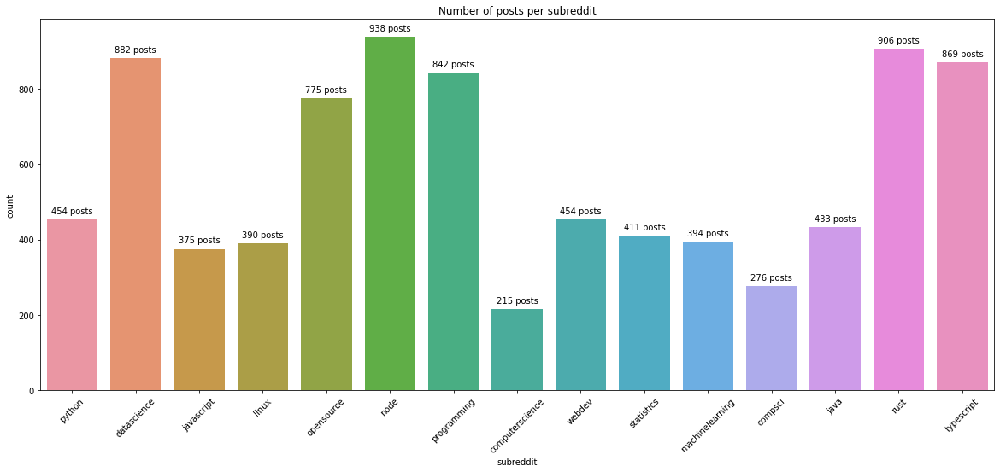

In [32]:
# Plot Number of posts per subreddit with the count of posts beside each bar
plt.figure(figsize=(20, 8))
plt.rcParams['figure.dpi'] = 300
plt.title('Number of posts per subreddit')
plt.xlabel('Subreddit')
plt.ylabel('Number of posts')
plt.xticks(rotation=45)
sns.countplot(x='subreddit', data=df)
for p in plt.gca().patches:
    plt.gca().annotate('{:1.0f} posts'.format(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()), 
                       ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
plt.show()

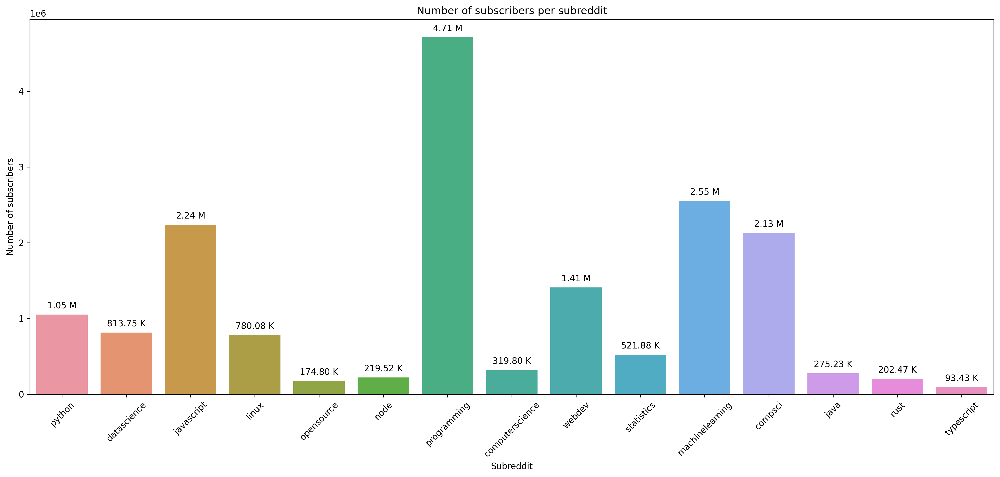

In [33]:
# Number of subscribers per subreddit
def pretty_number(number):
    # Convert number to in B, M, K format
    if number >= 1000000000:
        return '{:.2f} B'.format(number / 1000000000)
    elif number >= 1000000:
        return '{:.2f} M'.format(number / 1000000)
    elif number >= 1000:
        return '{:.2f} K'.format(number / 1000)
    else:
        return number

plt.figure(figsize=(20, 8))
plt.rcParams['figure.dpi'] = 300
sns.barplot(x='subreddit', y='subreddit_subscribers', data=df)
for p in plt.gca().patches:
    plt.gca().annotate('{}'.format(pretty_number(p.get_height())), (p.get_x() + p.get_width() / 2., p.get_height()),
                          ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
plt.title('Number of subscribers per subreddit')
plt.xlabel('Subreddit')
plt.ylabel('Number of subscribers')
plt.xticks(rotation=45)
plt.show()

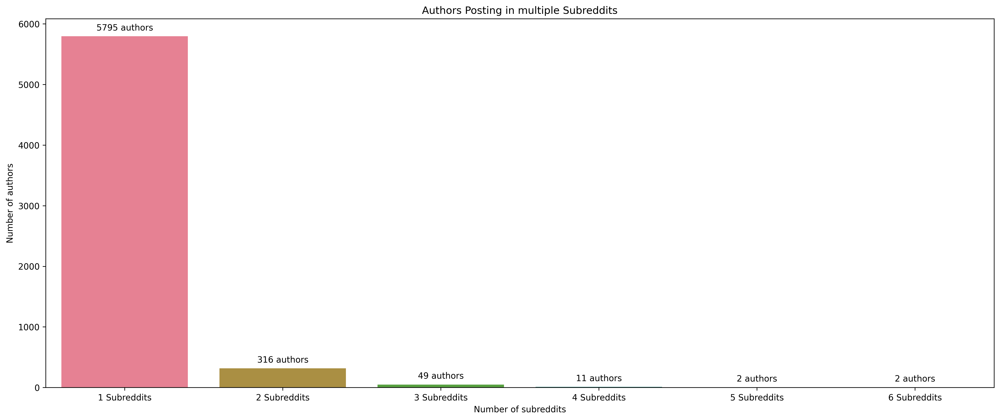

In [34]:
# Number of Authors who post in multiple subreddits
n_subreddits = df.groupby('author')['subreddit'].nunique()
plt.figure(figsize=(20, 8))
plt.rcParams['figure.dpi'] = 300
plt.title('Authors Posting in multiple Subreddits')
sns.countplot(x=n_subreddits, palette=sns.color_palette("husl"))
for p in plt.gca().patches:
    plt.gca().annotate('{:1.0f} authors'.format(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()),
                          ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

plt.xlabel('Number of subreddits')
plt.ylabel('Number of authors')
x_tick_labels = list(map(lambda x: '{} Subreddits'.format(x) if x > 1 else '{} Subreddits'.format(x), list(range(1, len(n_subreddits.unique()) + 1))))
plt.xticks(list(range(0, len(n_subreddits.unique()))), x_tick_labels)
plt.show()

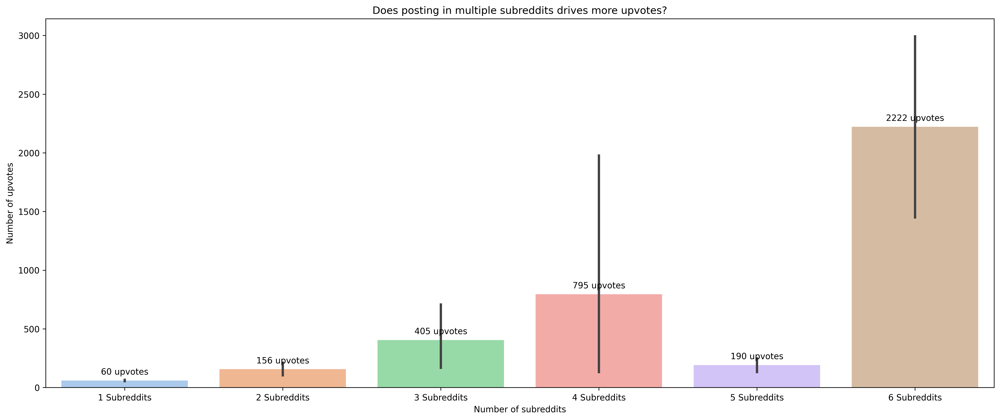

In [35]:
# Does posting in multiple subreddits drives more upvotes?
n_subreddits = df.groupby('author')['subreddit'].nunique()
n_upvotes = df.groupby('author')['score'].sum()
plt.figure(figsize=(20, 8))
plt.rcParams['figure.dpi'] = 300
sns.barplot(x=n_subreddits, y=n_upvotes, palette=sns.color_palette("pastel"))
for p in plt.gca().patches:
    plt.gca().annotate('{:1.0f} upvotes'.format(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()),
                          ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
plt.title('Does posting in multiple subreddits drives more upvotes?')
plt.xlabel('Number of subreddits')
plt.ylabel('Number of upvotes')
x_tick_labels = list(map(lambda x: '{} Subreddits'.format(x) if x > 1 else '{} Subreddits'.format(x), list(range(1, len(n_subreddits.unique()) + 1))))
plt.xticks(list(range(0, len(n_subreddits.unique()))), x_tick_labels)
plt.show()


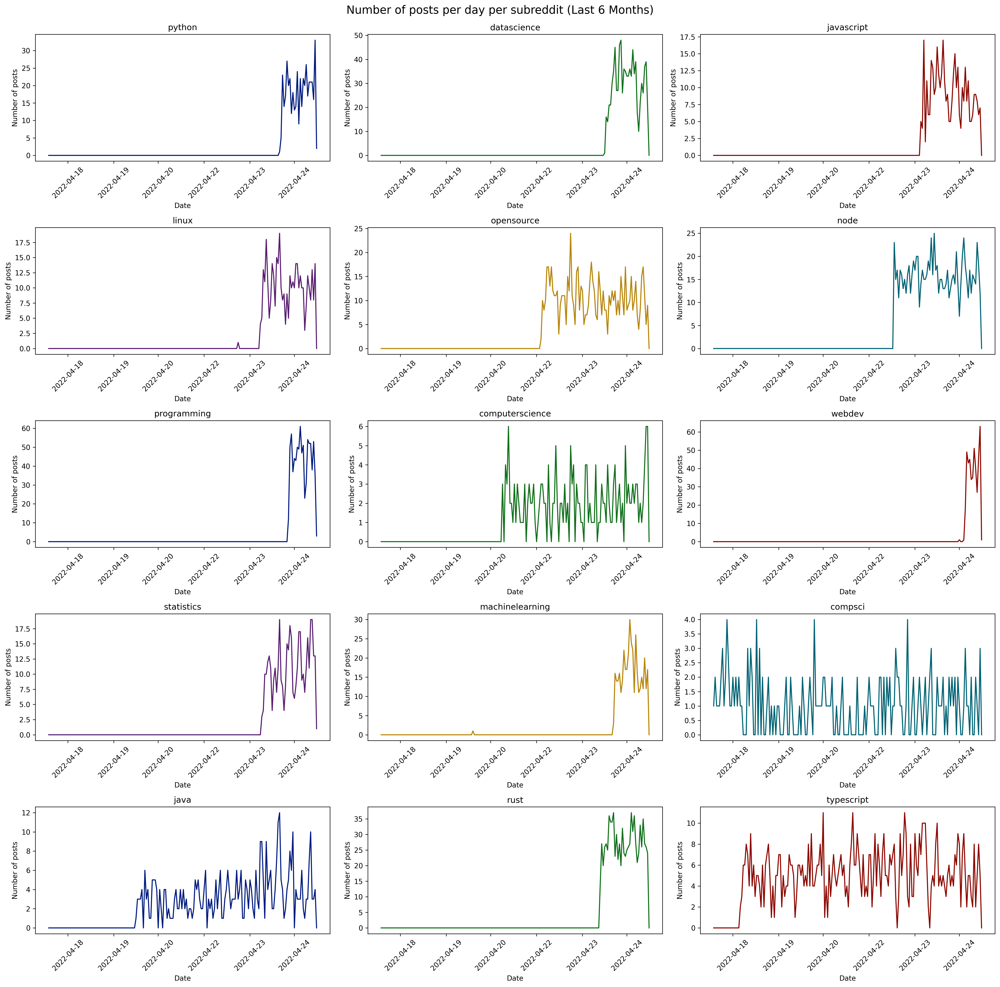

In [36]:
# Number of posts per day per subreddit
posts_df = df.groupby(['subreddit', 'created_utc']).size().reset_index(name='counts')
posts_df['created_utc'] = pd.to_datetime(posts_df['created_utc'], unit='s')
posts_df['created_utc'] = posts_df['created_utc'].dt.date
posts_df = posts_df.groupby(['subreddit', 'created_utc']).sum().reset_index()
posts_df = posts_df.pivot(index='created_utc', columns='subreddit', values='counts')
posts_df = posts_df.fillna(0)

# Select dates after 2021-01-01
import datetime
last_6M = datetime.date.today() - datetime.timedelta(days=180)
posts_df = posts_df.loc[posts_df.index >= last_6M]

# Plot number of posts per day per subreddit
subreddits = df['subreddit'].unique()
palette = sns.color_palette("dark6", len(subreddits))
fig, ax = plt.subplots(5, 3, figsize=(20, 20))
fig.set_dpi(300)
fig.suptitle('Number of posts per day per subreddit (Last 6 Months)\n', fontsize=16)
for i, subreddit in enumerate(subreddits):
    row = i // 3
    col = i % 3
    sns.lineplot(x=posts_df.index, y=subreddit, data=posts_df, ax=ax[row, col], color=palette[i])
    ax[row, col].set_title(subreddit)
    ax[row, col].set_xlabel('Date')
    ax[row, col].set_ylabel('Number of posts')
    ax[row, col].set_xticklabels(posts_df.index, rotation=45)
plt.tight_layout()
plt.show()

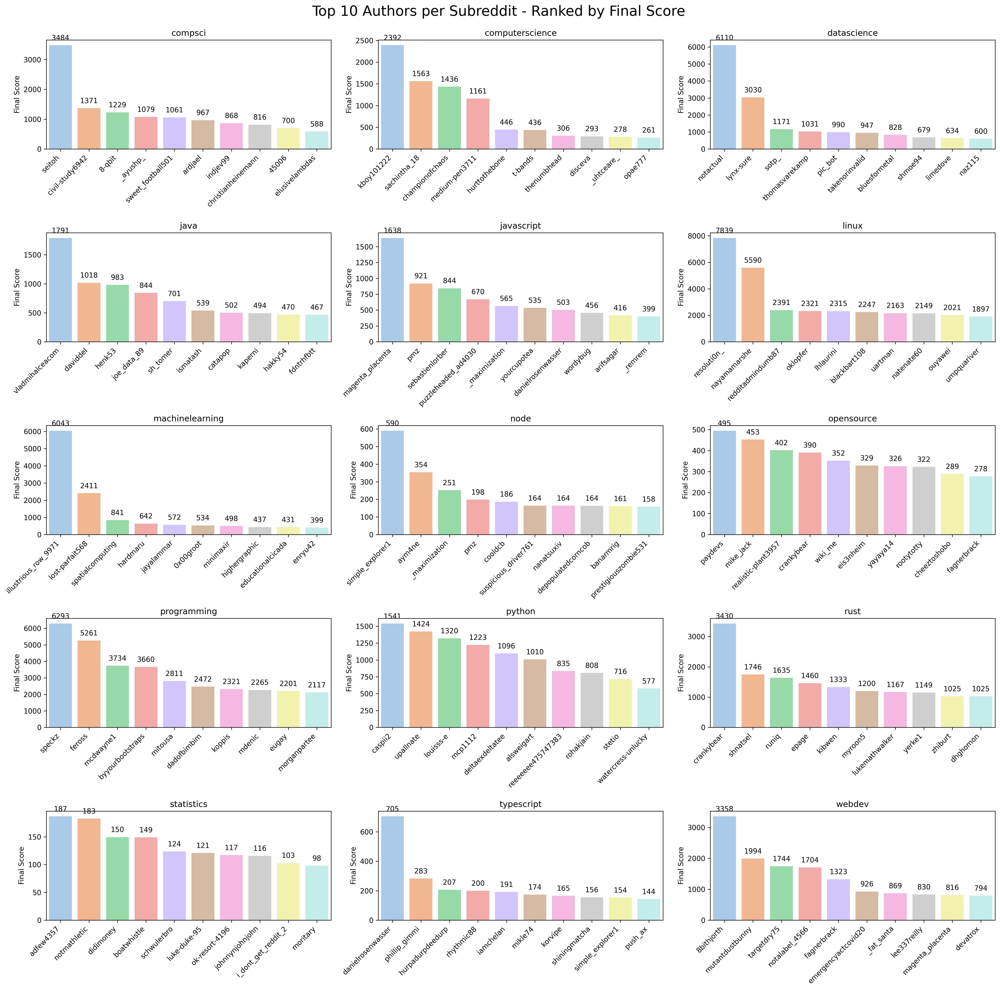

In [37]:
# Author Scoring Function
def author_scores(df):
    df_author = df[['author', 'score', 'subreddit', 'num_comments', 'upvote_ratio']]
    df_author['final_score'] = df_author['score'] * df_author['upvote_ratio'] + df_author['num_comments']
    df_author = df_author.groupby(['author', 'subreddit']).sum()
    df_author = df_author.reset_index()
    return df_author

# Plotting the top 10 authors per subreddit
top_10_authors_per_subreddit = author_scores(df).groupby('subreddit').apply(lambda x: x.nlargest(10, 'final_score'))
top_10_authors_per_subreddit = top_10_authors_per_subreddit.reset_index(drop=True)
fig, axes = plt.subplots(5, 3, figsize=(20, 20))
fig.suptitle('Top 10 Authors per Subreddit - Ranked by Final Score\n', fontsize=20)
fig.dpi = 300
for i, subreddit in enumerate(top_10_authors_per_subreddit['subreddit'].unique()):
    sns.barplot(x='author', y='final_score', data=top_10_authors_per_subreddit[top_10_authors_per_subreddit['subreddit'] == subreddit], ax=axes[i//3, i%3], palette=sns.color_palette("pastel", 10))
    for p in axes[i//3, i%3].patches:
        axes[i//3, i%3].annotate('{:1.0f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()),
                                  ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
    axes[i//3, i%3].set_title(subreddit)
    axes[i//3, i%3].set_xticklabels(axes[i//3, i%3].get_xticklabels(), rotation=45, horizontalalignment='right')
    axes[i//3, i%3].set_xlabel('')
    axes[i//3, i%3].set_ylabel('Final Score')
plt.tight_layout()
plt.show()

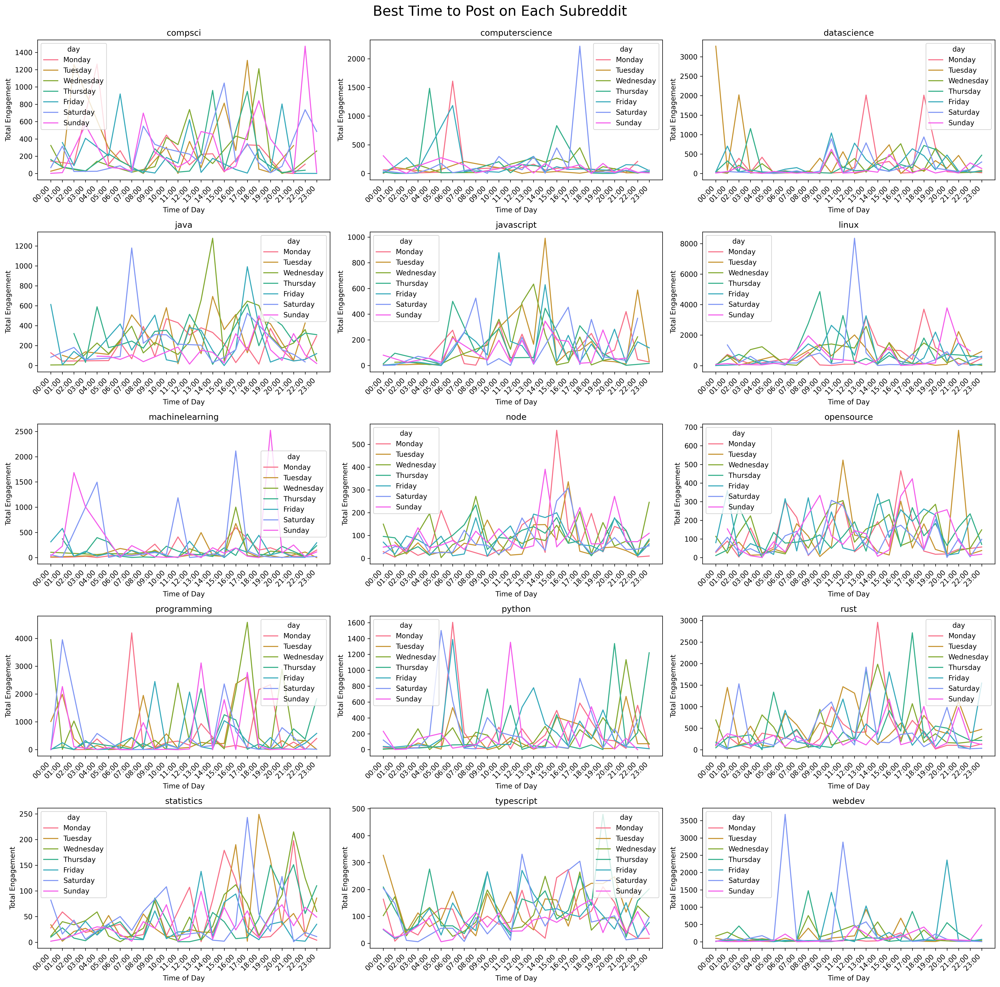

In [38]:
# Finding the best time to post on each subreddit
best_time_df = df[['subreddit', 'created_utc', 'score', 'num_comments']]
best_time_df['final_score'] = best_time_df['score'] + best_time_df['num_comments']
best_time_df.drop(['score', 'num_comments'], axis=1, inplace=True)

# Convert the created_utc column to datetime
best_time_df['created_utc'] = pd.to_datetime(best_time_df['created_utc'], unit='s')
best_time_df['day'] = best_time_df['created_utc'].dt.day_name()
best_time_df['hour'] = best_time_df['created_utc'].dt.hour
best_time_df.drop('created_utc', axis=1, inplace=True)

# Find total engagement per hour
best_time_df = best_time_df.groupby(['subreddit', 'day', 'hour']).sum()
best_time_df = best_time_df.reset_index()
days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
best_time_df['day'] = pd.Categorical(best_time_df['day'], categories=days, ordered=True)

# Plotting the best time to post on each subreddit
fig, axes = plt.subplots(5, 3, figsize=(20, 20))
fig.suptitle('Best Time to Post on Each Subreddit\n', fontsize=20)
fig.dpi = 300
for i, subreddit in enumerate(best_time_df['subreddit'].unique()):
    sns.lineplot(x='hour', y='final_score', hue='day', data=best_time_df[best_time_df['subreddit'] == subreddit], ax=axes[i//3, i%3], palette=sns.color_palette("husl", 7))
    axes[i//3, i%3].set_title(subreddit)
    axes[i//3, i%3].set_xticks(range(0, 24))
    axes[i//3, i%3].set_xticklabels(list(map(lambda x: (f'0{x}:00' if x < 10 else f'{x}:00'), list(range(0, 24)))), rotation=45, horizontalalignment='right')
    axes[i//3, i%3].set_xlabel('Time of Day')
    axes[i//3, i%3].set_ylabel('Total Engagement')
plt.tight_layout()
plt.show()

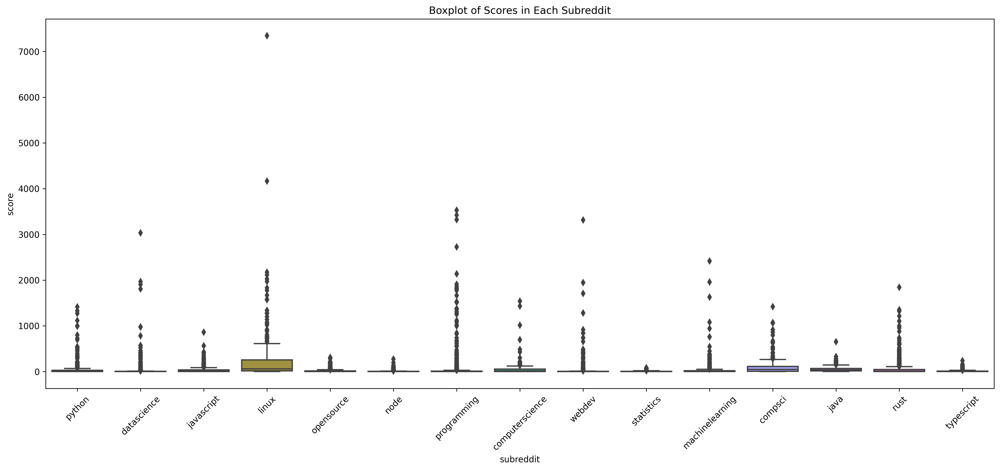

In [39]:
# Boxplot of the scores in each subreddit
plt.figure(figsize=(20, 8))
plt.rcParams['figure.dpi'] = 300
plt.title('Boxplot of Scores in Each Subreddit')
plt.xlabel('Subreddit')
plt.ylabel('Score')
plt.xticks(rotation=45)
sns.boxplot(x='subreddit', y='score', data=df, palette=sns.color_palette("husl", 15))
plt.show()

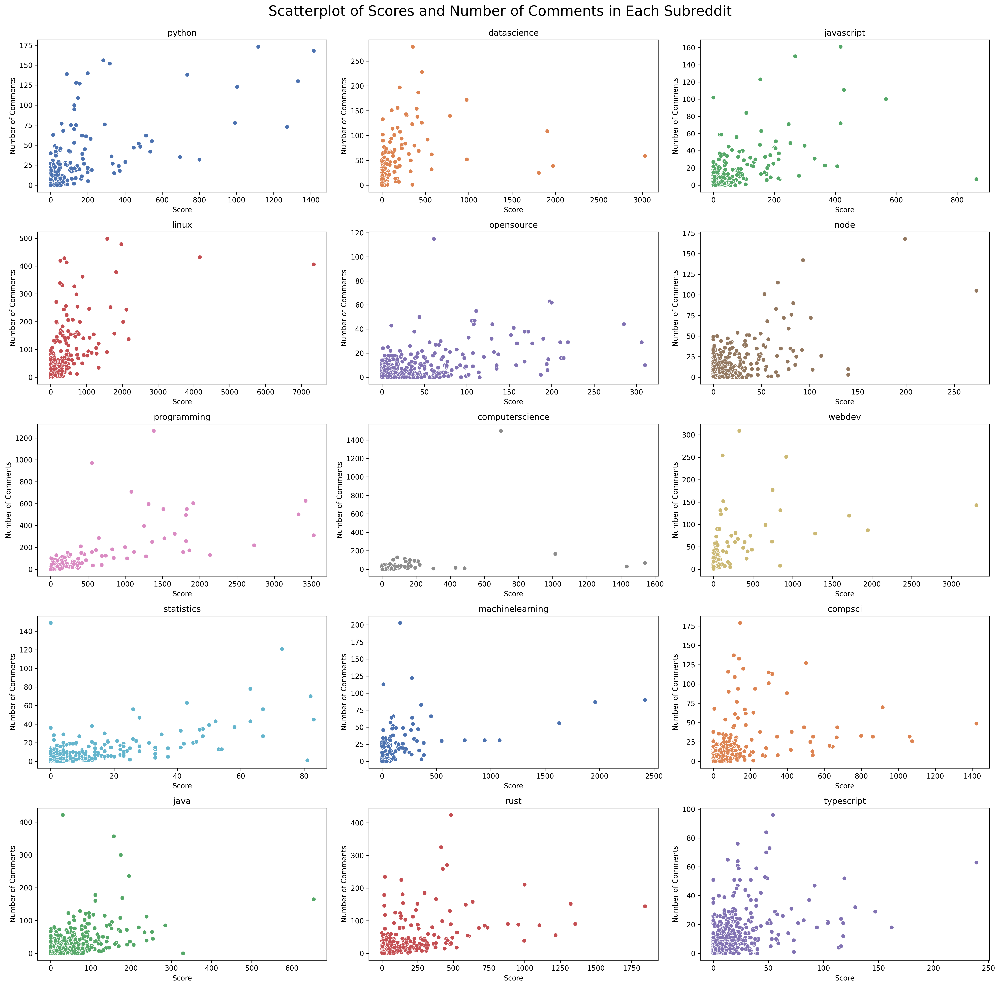

In [40]:
# Scatterplot of the scores and number of comments in each subreddit
fig, axes = plt.subplots(5, 3, figsize=(20, 20))
fig.suptitle('Scatterplot of Scores and Number of Comments in Each Subreddit\n', fontsize=20)
fig.dpi = 300
palette=sns.color_palette("deep", 15)
for i, subreddit in enumerate(df['subreddit'].unique()):
    sns.scatterplot(x='score', y='num_comments', data=df[df['subreddit'] == subreddit], ax=axes[i//3, i%3], color=palette[i])
    axes[i//3, i%3].set_title(subreddit)
    axes[i//3, i%3].set_xlabel('Score')
    axes[i//3, i%3].set_ylabel('Number of Comments')
    axes[i//3, i%3].grid(False)
plt.tight_layout()
plt.show()

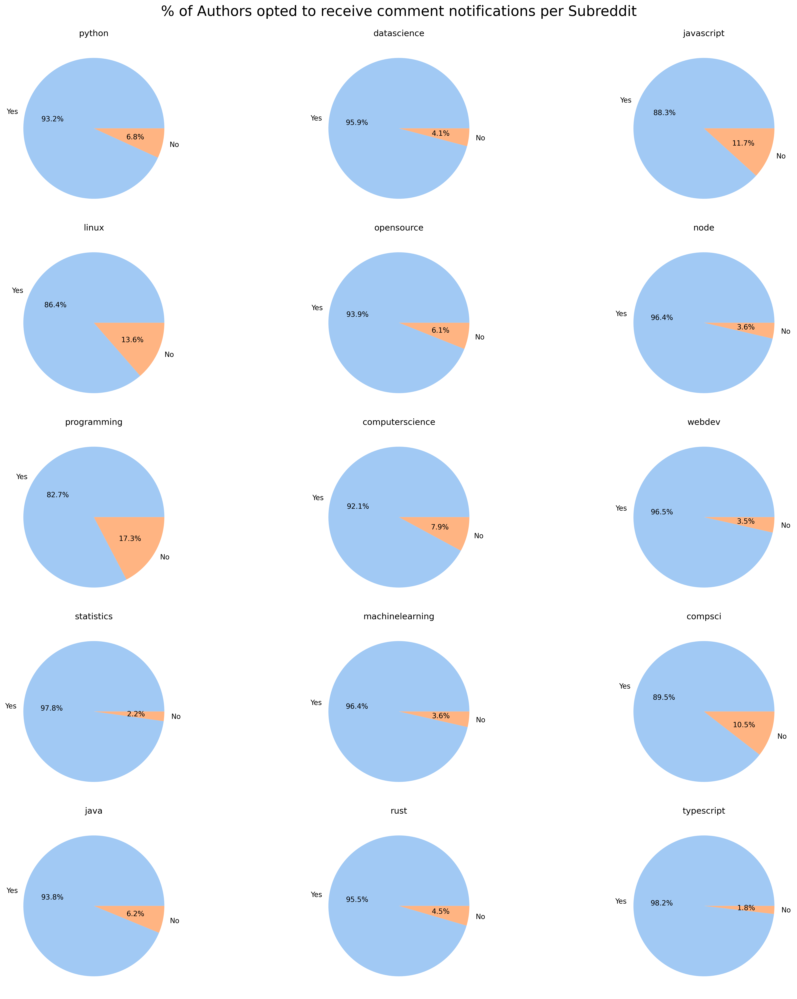

In [41]:
# plot pie chart of send_replies per subreddit
fig, ax = plt.subplots(5,3, figsize=(20, 20))
fig.dpi = 300
fig.patch.set_facecolor('white')

fig.suptitle('% of Authors opted to receive comment notifications per Subreddit\n', fontsize=20)
for i, subreddit in enumerate(df['subreddit'].unique()):
    colors = sns.color_palette('pastel')
    labels = ['Yes', 'No']
    ax[i//3, i%3].pie(df[df['subreddit'] == subreddit]['send_replies'].value_counts(), labels=labels, autopct='%1.1f%%', colors=colors)
    ax[i//3, i%3].set_title(subreddit)
plt.tight_layout()
plt.show()

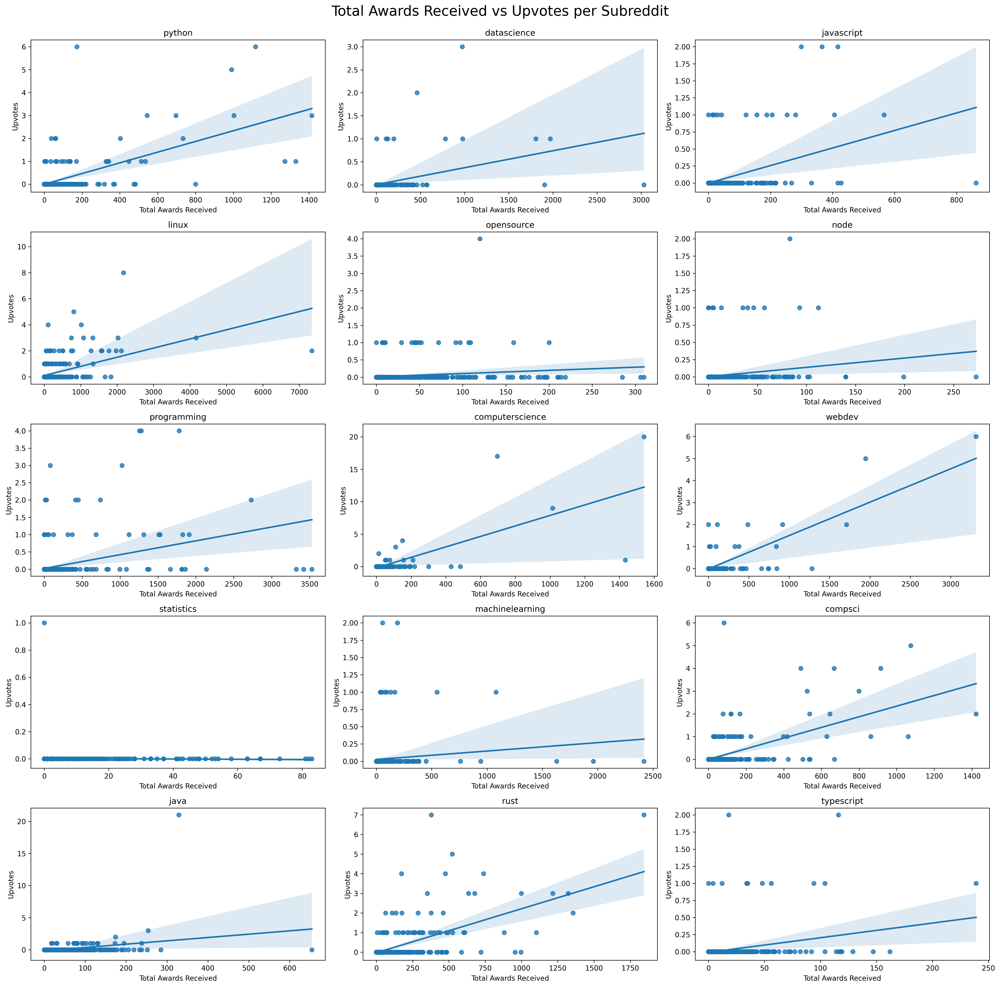

In [42]:
# plot total_awards_received per subreddit
fig, ax = plt.subplots(5,3, figsize=(20, 20))
fig.dpi = 300
fig.suptitle('Total Awards Received vs Upvotes per Subreddit\n', fontsize=20)
for i, subreddit in enumerate(df['subreddit'].unique()):
    sns.regplot(x='score', y='total_awards_received', data=df[df['subreddit'] == subreddit], ax=ax[i//3, i%3])
    ax[i//3, i%3].set_title(subreddit)
    ax[i//3, i%3].set_xlabel('Total Awards Received')
    ax[i//3, i%3].set_ylabel('Upvotes')
plt.tight_layout()
plt.show()

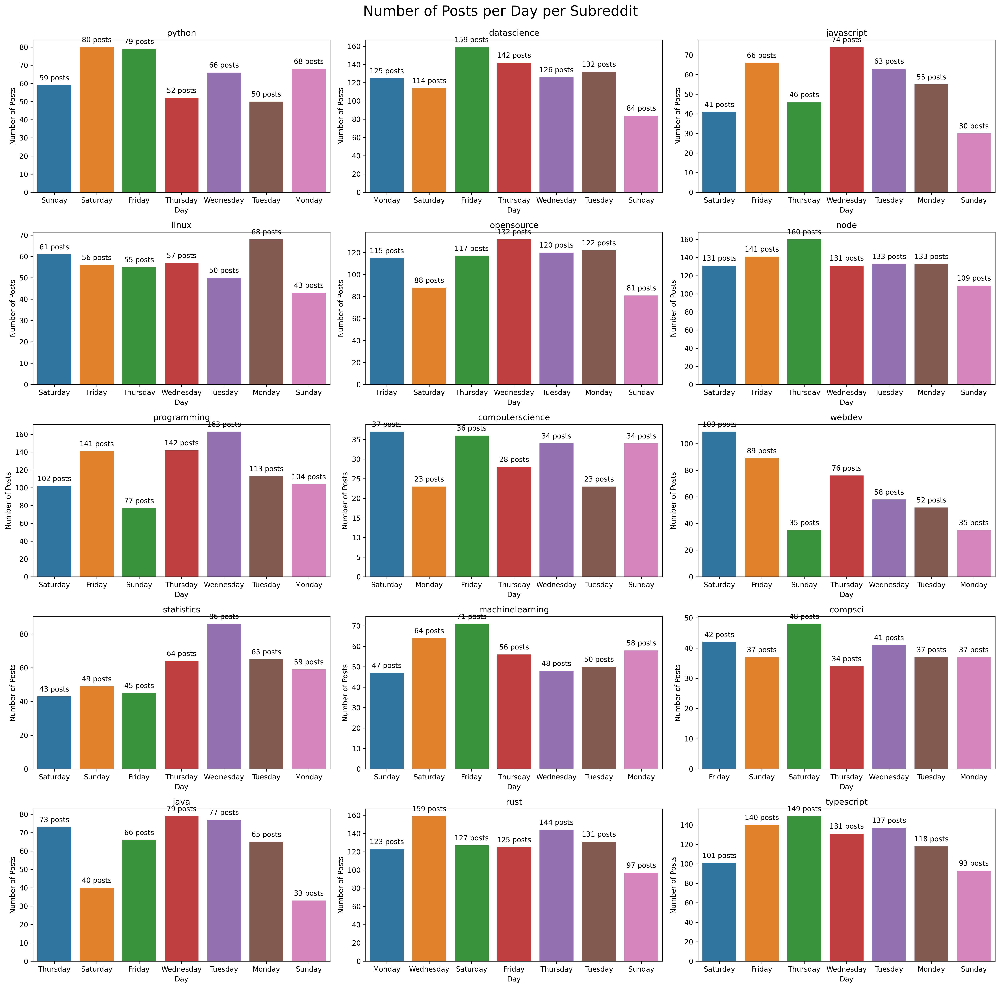

In [43]:
# plot number of posts per day per subreddit
num_post_df = df[['subreddit', 'created_utc']]
num_post_df['created_utc'] = pd.to_datetime(num_post_df['created_utc'], unit='s')
num_post_df['day'] = num_post_df['created_utc'].dt.day_name()

fig, ax = plt.subplots(5,3, figsize=(20, 20))
fig.dpi = 300
fig.suptitle('Number of Posts per Day per Subreddit\n', fontsize=20)
for i, subreddit in enumerate(num_post_df['subreddit'].unique()):
    sns.countplot(x='day', data=num_post_df[num_post_df['subreddit'] == subreddit], ax=ax[i//3, i%3])
    for p in ax[i//3, i%3].patches:
        ax[i//3, i%3].annotate('{:.0f} posts'.format(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
    ax[i//3, i%3].set_title(subreddit)
    ax[i//3, i%3].set_xlabel('Day')
    ax[i//3, i%3].set_ylabel('Number of Posts')
plt.tight_layout()
plt.show()
